In [43]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

In [5]:
ames = pd.read_csv("train.csv")

In [6]:
df = ames[['GarageType', "GarageCars","GarageCond","PavedDrive", "WoodDeckSF", "OpenPorchSF","EnclosedPorch","ScreenPorch", "YrSold", "SaleType", "SaleCondition", "SalePrice", 'LotArea']]

In [257]:
# GarageType - Garage or no Garage
# GarageCars
# GarageCond - further investigate
# PavedDrive - dummify them
# OpenPorchSF +
# EnclosedPorch + 
# ScreenPorch +
# YrSold
# SaleCondition Investigate Subgroups
df['GarageType'].unique()

array(['Attchd', 'Detchd', 'BuiltIn', 'CarPort', nan, 'Basment', '2Types'],
      dtype=object)

In [8]:
df.loc[:,('YrSold')] = list(int(str, df['GarageType']))

TypeError: 'Series' object cannot be interpreted as an integer

In [366]:
#GarageType - Garage or no Garage 
df.loc[:,('GarageType')] = list(map(str, df['GarageType']))
replacements = {"nan": 'N',
                'Attchd': 'Y',
                'Detchd': 'Y',
                 'BuiltIn': 'Y',
                'CarPort': 'Y',
                'Basment': 'Y',
                '2Types': 'Y'}
def replace_all(text, dic):
    for i, j in dic.items():
        text = text.replace(i, j)
    return text
df.loc[:,('GarageType')]= [replace_all(l, replacements) for l in df['GarageType']]

In [367]:
#GarageType - Garage or no Garage  part 2
df['GarageType'] = [0 if x == 'N' else 1 for x in df.GarageType]
df['GarageType'].value_counts()

C:\Users\juanr\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


1    1379
0      81
Name: GarageType, dtype: int64

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000027733A32D88>,
      dtype=object)

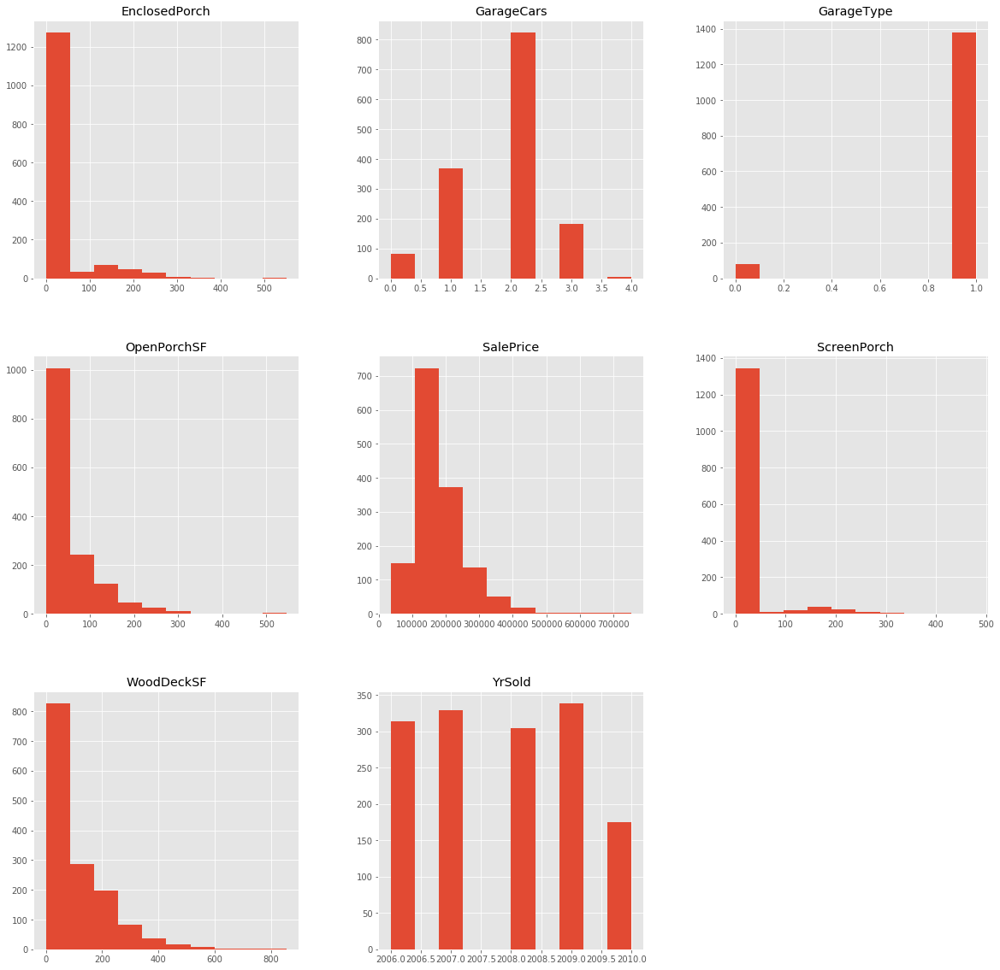

In [368]:
df.hist(figsize = (20, 20))

In [369]:
df.describe()

,GarageType,GarageCars,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,YrSold,SalePrice
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,0.944521,1.767123,94.244521,46.660274,21.954110,15.060959,2007.815753,180921.195890
std,0.228992,0.747315,125.338794,66.256028,61.119149,55.757415,1.328095,79442.502883
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2006.000000,34900.000000
25%,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,2007.000000,129975.000000
50%,1.000000,2.000000,0.000000,25.000000,0.000000,0.000000,2008.000000,163000.000000
75%,1.000000,2.000000,168.000000,68.000000,0.000000,0.000000,2009.000000,214000.000000
max,1.000000,4.000000,857.000000,547.000000,552.000000,480.000000,2010.000000,755000.000000


In [370]:
#Garagecars
df["GarageCars"].value_counts()

2    824
1    369
3    181
0     81
4      5
Name: GarageCars, dtype: int64

In [371]:
# GarageCond - Changed NA to 'No Garage' then changed to binary
df.loc[:,("GarageCond")] = df["GarageCond"].fillna("No Garage")
df['GarageCond'] = [0 if x == 'No Garage' else 1 for x in df.GarageCond]
df['GarageCond'].value_counts()

C:\Users\juanr\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


1    1379
0      81
Name: GarageCond, dtype: int64

(array([  81.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
        1379.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

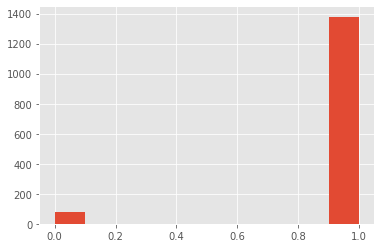

In [372]:
from matplotlib import pyplot as plt
plt.hist(df['GarageCond'])

<BarContainer object of 1460 artists>

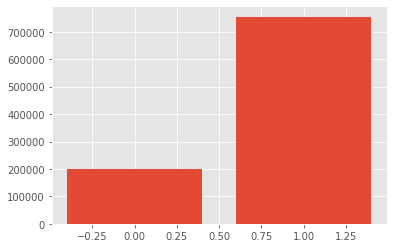

In [373]:
plt.bar(df['GarageCond'], df['SalePrice'])

In [375]:
#Dummify PavedDrive - converted to binary
df['PavedDrive'] = [0 if x == 'N' else 1 for x in df.PavedDrive]
df['PavedDrive'].unique()

C:\Users\juanr\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


array([1, 0], dtype=int64)

(array([  90.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
        1370.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

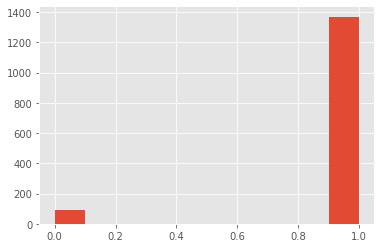

In [376]:
plt.hist(df['PavedDrive'])

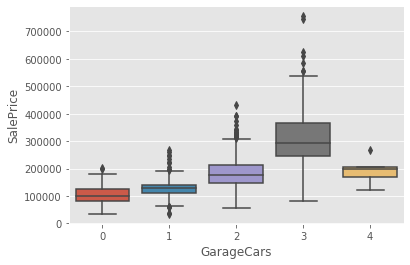

In [329]:
#Distribution of Garage Cars Capacity vs. Sale Price 
import seaborn as sns
sns.boxplot(df['GarageCars'], df['SalePrice'])

In [330]:
#Sum: OpenPorchSF + EnclosedPorch + ScreenPorch
total_sum= df["OpenPorchSF"]+ df["EnclosedPorch"] + df["ScreenPorch"]
df['Total.Porch'] = total_sum
df['Total.Porch']


C:\Users\juanr\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


0        61
1         0
2        42
3       307
4        84
       ... 
1455     40
1456      0
1457     60
1458    112
1459     68
Name: Total.Porch, Length: 1460, dtype: int64

In [381]:
#Binary of each OpenPorchSF , EnclosedPorch , ScreenPorch in separate new columns
df['New.OpenPorchSF'] = [0 if x == 0 else 1 for x in df.OpenPorchSF]
df['New.EnclosedPorch'] = [0 if x == 0 else 1 for x in df.EnclosedPorch]
df['New.ScreenPorch'] = [0 if x == 0 else 1 for x in df.ScreenPorch]
df

C:\Users\juanr\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\juanr\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\juanr\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = val

,GarageType,GarageCars,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,YrSold,SaleType,SaleCondition,SalePrice,New.OpenPorchSF,New.EnclosedPorch,New.ScreenPorch
0,1,2,1,1,0,61,0,0,2008,WD,Normal,208500,1,0,0
1,1,2,1,1,298,0,0,0,2007,WD,Normal,181500,0,0,0
2,1,2,1,1,0,42,0,0,2008,WD,Normal,223500,1,0,0
3,1,3,1,1,0,35,272,0,2006,WD,Abnorml,140000,1,1,0
4,1,3,1,1,192,84,0,0,2008,WD,Normal,250000,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1,2,1,1,0,40,0,0,2007,WD,Normal,175000,1,0,0
1456,1,2,1,1,349,0,0,0,2010,WD,Normal,210000,0,0,0
1457,1,1,1,1,0,60,0,0,2010,WD,Normal,266500,1,0,0
1458,1,1,1,1,366,0,112,0,2010,WD,Normal,142125,0,1,0


In [384]:
# SaleCodition Investigate Subgroups
df["SaleCondition"].unique()

array(['Normal', 'Abnorml', 'Partial', 'AdjLand', 'Alloca', 'Family'],
      dtype=object)

In [299]:
# YrSold
df["YrSold"].unique()

array([2008, 2007, 2006, 2009, 2010], dtype=int64)

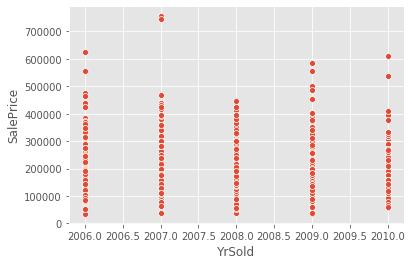

In [332]:
#Doesn't seem like predictor 
sns.scatterplot(df['YrSold'], df['SalePrice'])

In [7]:
df["LotArea"]

0        8450
1        9600
2       11250
3        9550
4       14260
        ...  
1455     7917
1456    13175
1457     9042
1458     9717
1459     9937
Name: LotArea, Length: 1460, dtype: int64

In [24]:
#Cleaning Data For Models 
import pandas as pd
import numpy as np
df1 = pd.read_csv("final_train.csv")
df1 = df1.loc[:,("PavedDrive"):]
# df1['SalePrice']

In [25]:
df1.describe()

,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscVal,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
count,1456.000000,1456.000000,1456.000000,1456.000000,1456.000000,1456.000000,1456.000000,1456.000000,1456.000000,1456.000000,...,1456.000000,1456.000000,1456.000000,1456.000000,1456.000000,1456.000000,1456.000000,1456.000000,1456.000000,1456.000000
mean,1.855769,2.448979,2.301153,22.014423,3.418956,15.102335,2.055632,0.011676,0.565247,43.608516,...,0.003434,0.003434,0.082418,0.002060,0.868819,0.002747,0.008242,0.013736,0.822115,0.084478
std,0.497217,2.595194,2.150232,61.192248,29.357056,55.828405,35.383772,0.211038,1.204174,496.799265,...,0.058520,0.058520,0.275094,0.045361,0.337715,0.052360,0.090440,0.116434,0.382547,0.278199
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000
50%,2.000000,0.000000,3.218876,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,2.000000,5.129899,4.234107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000
max,2.000000,6.754604,6.306275,552.000000,508.000000,480.000000,738.000000,5.000000,4.000000,15500.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [26]:
#Corr Map - MSSubClass_SC150 is nan
cor_map = df1.corr()
cor_map.style.background_gradient(cmap='coolwarm', axis = None)

C:\Users\juanr\Anaconda3\lib\site-packages\matplotlib\colors.py:527: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


In [29]:
df1.MSSubClass_SC150.unique()

array([0], dtype=int64)

In [11]:
response_var = df1[['SalePrice']]
feats = df1.drop('SalePrice', axis =1)

In [37]:
from sklearn import metrics, linear_model
from sklearn.model_selection import KFold, train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso, RidgeCV, LassoCV
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('ggplot')

In [13]:
np.random.seed(1)
Xtrain, Xtest, ytrain, ytest = train_test_split(feats, response_var)

# Fitting Ordinary Linear Regression

In [14]:
#Fitting Ordinary Linear Regression 
ols = LinearRegression()
ols.fit(Xtrain, ytrain)

print("R-squared:", ols.score(Xtrain, ytrain))
print("Intercept:", ols.intercept_)
print("Coefficients:", ols.coef_)

R-squared: 0.9237588162194361
Intercept: [15.96825178]
Coefficients: [[ 2.21224733e-02  4.27858800e-03  4.05779224e-03  1.76292017e-04
   2.33494999e-04  2.67933409e-04  3.86126581e-04 -1.93794481e-02
  -3.34595688e-03  5.93893242e-05 -5.04992737e-03 -1.52093860e-03
   6.04820334e-02  3.89367679e-02  8.40874339e-03  8.81762058e-03
   1.80290605e-03  1.00526558e-02  4.84665863e-01 -2.07085414e-02
   6.87912541e-02  1.07141726e-13 -1.76369493e-02  3.77537772e-02
   1.96542979e-01  1.16629695e-01  3.68410079e-02  3.01935576e-02
  -2.73526048e-01  6.87944129e-02  1.37565823e-01  1.26707275e-01
   1.50469308e-01  1.09024060e-01  5.46437519e-02  2.59360252e-02
   1.10125009e-01  6.82434995e-02  1.29819027e-01  1.30071410e-01
  -6.49153228e-02 -9.05266558e-03  1.76567323e-02  3.73634676e-02
   1.38791795e-01  3.15426655e-03  3.83916536e-03 -1.95820891e-02
  -7.66689464e-03  4.27214605e-01  1.76405272e-02 -4.85946962e-02
  -2.54316914e-02 -7.21666485e-03  3.28807371e-02  3.51397186e-02
  -7.91

In [15]:
predictions_train = ols.predict(Xtrain)
predictions_test = ols.predict(Xtest)
predictions_train
#predictions_test

array([[11.96029074],
       [12.5907729 ],
       [12.0436384 ],
       ...,
       [11.68343203],
       [11.37117015],
       [11.53492089]])

# 5-fold cross-validation on the training set

In [16]:
#5-fold cross-validation on the training set
cv_scores = cross_val_score(ols, Xtrain, ytrain, cv=5)

print('Training Score:', ols.score(Xtrain, ytrain))
print('Cross validation scores:', cv_scores)
print('Mean cross validation score:', cv_scores.mean())
print('Test Score:', ols.score(Xtest, ytest))

Training Score: 0.9237588162194361
Cross validation scores: [0.82865186 0.86801593 0.88233689 0.84288915 0.82896689]
Mean cross validation score: 0.8501721423347807
Test Score: 0.8874051911903836


In [17]:
# Shuffled 5-fold cross validation scores are rather similar
kf = KFold(n_splits=5, shuffle=True, random_state=1)
cv_scores_shuffled = cross_val_score(ols, Xtrain, ytrain, cv=kf)

print('Shuffled cross validation score:', cv_scores_shuffled)
print('Mean shuffled cross validation score:', cv_scores_shuffled.mean())

Shuffled cross validation score: [0.80256083 0.8698623  0.8713498  0.87733805 0.8868795 ]
Mean shuffled cross validation score: 0.8615980948071659


In [18]:
print('Mean Squared Error:', metrics.mean_squared_error(ytest, predictions_test)) #Not Good
print('Root Mean Squared Error:', (metrics.mean_squared_error(ytest, predictions_test))**0.5) #Not Good

Mean Squared Error: 0.020206598233595306
Root Mean Squared Error: 0.14214991464505108


# Ridge & Lasso

In [19]:
# Ridge Cross-Validation
ridge_mod = RidgeCV(alphas=(-5, 5, 10), cv=5)
ridge_mod.fit(Xtrain, ytrain)

print('Best Ridge alpha:', ridge_mod.alpha_)
print('Training score:', ridge_mod.score(Xtrain, ytrain))
print("Test Score:", ridge_mod.score(Xtest, ytest))

Best Ridge alpha: 5
Training score: 0.9167226694665223
Test Score: 0.8988095074100416


C:\Users\juanr\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


In [20]:
# With Alpha Score from Above// Similar 
ridge_mod = Ridge(alpha=4)

scores = cross_val_score(ridge_mod, Xtrain, ytrain, cv=5)
print("Cross-validated training scores:", scores)
print("Mean cross-validated training score:", scores.mean())

ridge_mod.fit(Xtrain, ytrain)
print("Training Score:", ridge_mod.score(Xtrain, ytrain))
print("Test Score:", ridge_mod.score(Xtest, ytest))

Cross-validated training scores: [0.839536   0.89992845 0.9046049  0.88190186 0.90131155]
Mean cross-validated training score: 0.8854565513228986
Training Score: 0.9178396978377228
Test Score: 0.8992080784000422


In [21]:
ridge_predictions = ridge_mod.predict(Xtest)
print('Mean Squared Error:', metrics.mean_squared_error(ytest, ridge_predictions)) 
print('Root Mean Squared Error:', (metrics.mean_squared_error(ytest, ridge_predictions))**0.5)


Mean Squared Error: 0.018088417099283164
Root Mean Squared Error: 0.13449318607008745


In [22]:
# Lasso Cross-Validation
lasso_mod = LassoCV(alphas=np.logspace(-4, 4, 10), cv=5)
lasso_mod.fit(Xtrain, ytrain)

print('Best Lasso alpha:', lasso_mod.alpha_)
print('Training score:', lasso_mod.score(Xtrain, ytrain))
print("Test Score:", lasso_mod.score(Xtest, ytest))

Best Lasso alpha: 0.000774263682681127
Training score: 0.9069819380719498
Test Score: 0.8951326321146306


C:\Users\juanr\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:1100: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [23]:
lasso_predictions = lasso_mod.predict(Xtest)
print('Mean Squared Error:', metrics.mean_squared_error(ytest, lasso_predictions)) 
print('Root Mean Squared Error:', (metrics.mean_squared_error(ytest, lasso_predictions))**0.5)

Mean Squared Error: 0.018819808773398068
Root Mean Squared Error: 0.1371853081543285


In [34]:
lasso = Lasso()

In [35]:
lasso.set_params(normalize=True, max_iter = 10000) 

lasso_scores_train = []
lasso_scores_test = []
coefs_lasso  = []

alphas = np.linspace(0.000001, .01,100)

for alpha in alphas:
    lasso.set_params(alpha=alpha) # try new alpha level
    lasso.fit(Xtrain, ytrain) # fit test data
    lasso_scores_train.append(lasso.score(Xtrain,ytrain)) # record R2 train
    lasso_scores_test.append(lasso.score(Xtest,ytest)) # record R2 test
    coefs_lasso.append(lasso.coef_) # record coef values
    
lasso_scores_train = pd.Series(lasso_scores_train) 
lasso_scores_test  = pd.Series(lasso_scores_test)
coefs_lasso = pd.DataFrame(coefs_lasso, index = alphas, columns = Xtrain.columns)  
coefs_lasso.head()

,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscVal,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0.000001,0.021973,0.004326,0.003810,0.000167,0.000228,0.000274,0.000353,-0.013893,-0.003242,0.000005,...,0.004700,0.037684,0.039543,0.060709,0.02229,-0.081321,0.045201,0.009704,0.074108,0.117906
0.000102,0.020628,0.003252,0.002314,0.000000,0.000000,0.000202,0.000144,0.000000,-0.000320,-0.000000,...,-0.004245,0.000000,0.004578,0.000000,-0.00000,-0.000000,0.000000,-0.000000,0.040629,0.090937
0.000203,0.018220,0.002837,0.001730,-0.000000,0.000000,0.000162,0.000038,0.000000,-0.000000,-0.000000,...,-0.000000,0.000000,0.000000,0.000000,-0.00000,-0.000000,0.000000,-0.000000,0.015877,0.070514
0.000304,0.016041,0.002057,0.001116,-0.000000,0.000000,0.000113,0.000000,0.000000,-0.000000,-0.000000,...,-0.000000,0.000000,0.000000,0.000000,-0.00000,-0.000000,0.000000,-0.000000,0.000000,0.053687
0.000405,0.013640,0.001160,0.000860,-0.000000,0.000000,0.000063,0.000000,0.000000,-0.000000,-0.000000,...,-0.000000,-0.000000,0.000000,0.000000,-0.00000,-0.000000,0.000000,-0.000000,0.000000,0.051444


Text(0.5, 1.0, 'Lambda vs. Coefficients')

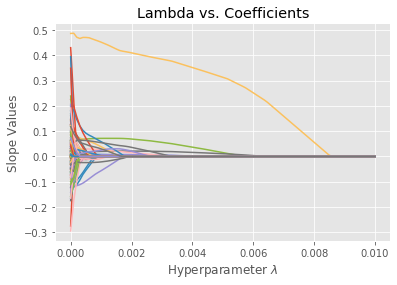

In [39]:
for name in coefs_lasso.columns:
    plt.plot(coefs_lasso.index, coefs_lasso[name], label=name)
plt.xlabel(r'Hyperparameter $\lambda$')
plt.ylabel(r'Slope Values')
plt.title(r'Lambda vs. Coefficients')